# Directed Lagged-Correlation Graphs Across the Audio→Tactile 500 ms Interval

For a single P2_500ms trial, compute a sliding **lagged** cross-correlation between every pair of electrodes across the 0 → 500 ms window between the auditory cue and the tactile stimulus. Visualize each window as a directed graph (arrow = who leads whom, width = |r|, color = sign of r) and look for patterns that persist across windows.

- Window: 40 ms, step: 5 ms, max lag: ±10 ms
- Signal: one trial (no averaging), z-scored via `load_eeg_data(normalize=True)`
- Layout: 2D scalp layout from `mne.channels.make_standard_montage('standard_1020')`

## A. Setup

In [ ]:
%load_ext autoreload
%autoreload 2

import numpy as np
import matplotlib.pyplot as plt

from utils import load_eeg_data
from connectivity import (
    select_p2_500ms,
    roi_order,
    reorder_corr,
    draw_roi_heatmap,
    draw_roi_anchor_timeseries,
)
from lagged_graph import (
    sliding_lagged_from_epochs,
    build_directed_graph,
    draw_lagged_graph,
    scalp_positions,
    consistency_across_windows,
    anchor_sliding_lagged_from_epochs,
    anchor_pair_sliding_curves_from_epochs,
    draw_sliding_lag_heatmaps,
)

SUBJECT = 5
TRIAL_IDX = 0
WINDOW_MS = 40
STEP_MS = 5
MAX_LAG_MS = 10

# Edge-filter knobs (see docstring of build_directed_graph).
R_THRESH = 0.2                  # |r| noise floor
MIN_ABS_LAG_SAMPLES = 2         # require |lag| >= ~4 ms at 500 Hz
LAG_GAIN_THRESH = 0.08          # |r_peak| - |r_at_zero| must exceed this
TOP_K = 5                      # cap edges per frame (None = off)

# Narrowband filter — removes the slow common-mode drift that made every
# pair correlate at r ~ 1 in v1. 'beta' is the canonical sensorimotor /
# anticipation band for this paradigm.
FREQ_BAND = 'beta'

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [ ]:
import matplotlib.animation as animation
from IPython.display import HTML
from matplotlib import rc
import matplotlib
matplotlib.rcParams['animation.embed_limit'] = 2**128
rc('animation', html='jshtml')

## B. Load and crop to the 0 → 500 ms anticipatory window

P2 trials are labeled relative to the auditory cue at `t = 0`; the tactile stimulus arrives at `t = +0.5 s` on `P2_500ms` trials. Cropping here isolates the cue→touch anticipatory interval.

In [2]:
epochs = load_eeg_data('P2', SUBJECT, tmin=0.0, tmax=0.5,
                       freq_band=FREQ_BAND, normalize=True)
epochs = select_p2_500ms(epochs)

print(f'trials (P2_500ms): {len(epochs)}')
print(f'n_channels: {len(epochs.ch_names)}')
print(f'time axis: {epochs.times[0]:.3f} .. {epochs.times[-1]:.3f} s'
      f'  (n_times={len(epochs.times)}, sfreq={epochs.info["sfreq"]} Hz)')

/home/hice1/nmanikandan8/phys-of-cog-project/utils.py:127: RuntimeWarning: At least one epoch has multiple events. Only the latency of the first event will be retained.
  epochs = mne.io.read_epochs_eeglab(file_path, verbose=False)


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


/home/hice1/nmanikandan8/phys-of-cog-project/utils.py:158: RuntimeWarning: filter_length (521) is longer than the signal (257), distortion is likely. Reduce filter length or filter a longer signal.
  epochs.filter(l_freq=band[0], h_freq=band[1], verbose=False)


trials (P2_500ms): 30
n_channels: 32
time axis: 0.000 .. 0.500 s  (n_times=257, sfreq=512.0 Hz)


## C. Single-trial sliding lagged cross-correlation

In [3]:
r_tensor, lag_tensor, r0_tensor, centers_s, ch_names = sliding_lagged_from_epochs(
    epochs,
    window_ms=WINDOW_MS,
    step_ms=STEP_MS,
    max_lag_ms=MAX_LAG_MS,
    use='single_trial',
    trial_idx=TRIAL_IDX,
)
sfreq = epochs.info['sfreq']
print(f'r_tensor shape:   {r_tensor.shape}')
print(f'lag_tensor shape: {lag_tensor.shape}')
print(f'r0_tensor shape:  {r0_tensor.shape}')
print(f'windows centered from {centers_s[0]:.3f} s to {centers_s[-1]:.3f} s'
      f'  (n_windows={len(centers_s)})')

r_tensor shape:   (80, 32, 32)
lag_tensor shape: (80, 32, 32)
r0_tensor shape:  (80, 32, 32)
windows centered from 0.019 s to 0.481 s  (n_windows=80)


#### Arrow i → j means channel *i* leads channel *j* by the lag of peak |r|. Edge width ∝ |r|, red = positive correlation, blue = negative.

## Anchor-electrode variant

### C3

In [ ]:
anchor = 'C3'

a_r, a_lag, a_r0, a_centers, _ = anchor_sliding_lagged_from_epochs(
    epochs,
    anchors=[anchor],
    window_ms=WINDOW_MS,
    step_ms=STEP_MS,
    max_lag_ms=MAX_LAG_MS,
    use='single_trial',
    trial_idx=TRIAL_IDX,
)

expected = 2 * (len(ch_names) - 1)
print(
    f'anchor {anchor}: r shape {a_r.shape}, non-zero entries per window '
    f'{int((a_r[0] != 0).sum())} (expected {expected})'
)

anchor C3: r shape (80, 32, 32), non-zero entries per window 63 (expected 62)


In [26]:
%%capture

fig, ax = plt.subplots(figsize=(8, 8))
fig.canvas.draw()

frame_images_a = []
for w in range(len(a_centers)):
    ax.clear()

    G = build_directed_graph(
        a_r[w],                 # use the selected window
        a_lag[w],               # use the selected window
        ch_names,
        r_at_zero_matrix=a_r0[w],
        r_threshold=R_THRESH,
        min_abs_lag_samples=MIN_ABS_LAG_SAMPLES,
        lag_gain_threshold=LAG_GAIN_THRESH,
        sfreq=sfreq,
        top_k=TOP_K
    )

    draw_lagged_graph(
        G,
        ax,
        pos=anchor_pos,
        title=f'Anchor {anchor}  t={a_centers[w]:+.3f} s  ({G.number_of_edges()} edges)',
    )
    fig.canvas.draw()
    frame_images_a.append(np.asarray(fig.canvas.buffer_rgba()).copy())
plt.close(fig)

In [27]:
fig, ax = plt.subplots(figsize=(8, 8))
ax.axis('off')
im = ax.imshow(frame_images_a[0])

def update(frame):
    im.set_array(frame_images_a[frame])
    return (im,)

ani = animation.FuncAnimation(
    fig, update, frames=len(frame_images_a),
    interval=150, blit=True, repeat=True,
)
plt.close(fig)
HTML(ani.to_jshtml())

In [17]:
anchor = 'FZ'

b_r, b_lag, b_r0, b_centers, _ = anchor_sliding_lagged_from_epochs(
    epochs,
    anchors=[anchor],
    window_ms=WINDOW_MS,
    step_ms=STEP_MS,
    max_lag_ms=MAX_LAG_MS,
    use='single_trial',
    trial_idx=TRIAL_IDX,
)

expected = 2 * (len(ch_names) - 1)
print(
    f'anchor {anchor}: r shape {b_r.shape}, non-zero entries per window '
    f'{int((b_r[0] != 0).sum())} (expected {expected})'
)

anchor FZ: r shape (80, 32, 32), non-zero entries per window 63 (expected 62)


In [18]:
%%capture

fig, ax = plt.subplots(figsize=(8, 8))
fig.canvas.draw()

frame_images_b = []
for w in range(len(b_centers)):
    ax.clear()

    G = build_directed_graph(
        b_r[w],                 # use the selected window
        b_lag[w],               # use the selected window
        ch_names,
        r_at_zero_matrix=b_r0[w],
        r_threshold=R_THRESH,
        min_abs_lag_samples=MIN_ABS_LAG_SAMPLES,
        lag_gain_threshold=LAG_GAIN_THRESH,
        sfreq=sfreq,
    )

    draw_lagged_graph(
        G,
        ax,
        pos=anchor_pos,
        title=f'Anchor {anchor}  t={b_centers[w]:+.3f} s  ({G.number_of_edges()} edges)',
    )
    fig.canvas.draw()
    frame_images_b.append(np.asarray(fig.canvas.buffer_rgba()).copy())
plt.close(fig)

In [19]:
fig, ax = plt.subplots(figsize=(8, 8))
ax.axis('off')
im = ax.imshow(frame_images_b[0])

def update(frame):
    im.set_array(frame_images_b[frame])
    return (im,)

ani = animation.FuncAnimation(
    fig, update, frames=len(frame_images_b),
    interval=150, blit=True, repeat=True,
)
plt.close(fig)
HTML(ani.to_jshtml())

### ROI-averaged anchor correlation

Average the anchor's peak-|r| (and signed peak r) with every electrode in each scalp
ROI. That gives 6 numbers per sliding window — one per ROI.

In [ ]:
draw_roi_anchor_timeseries(a_r, a_centers, ch_names, anchor='C3')
plt.show()

In [ ]:
draw_roi_anchor_timeseries(b_r, b_centers, ch_names, anchor='FZ')
plt.show()

### Lagged correlation curves for key pairs

Same `WINDOW_MS` / `STEP_MS` / `MAX_LAG_MS` as the graph above, but we keep
the full `r(τ)` profile in every window instead of collapsing to `(peak r, peak lag)`.
Each panel is an `(n_windows, 2L+1)` heatmap for one (anchor, other) pair:
x = window-center time, y = lag (positive = anchor leads), color = r. A ridge
consistently above or below τ=0 means a stable directional lead; parallel bands
point to oscillatory coupling; a blob straddling τ=0 is a common-mode bump
that the graph's lag-gain filter would reject.

In [ ]:
# Channels of interest per anchor; drop any that aren't in this subject's montage.
C3_OTHERS = [c for c in ['CZ', 'C4', 'FZ', 'PZ', 'FC3', 'CP3'] if c in ch_names]
FZ_OTHERS = [c for c in ['FP1', 'F3', 'F4', 'CZ', 'PZ', 'OZ']  if c in ch_names]

centers_c3, lags_ms, curves_c3 = anchor_pair_sliding_curves_from_epochs(
    epochs, anchor='C3', others=C3_OTHERS,
    window_ms=WINDOW_MS, step_ms=STEP_MS, max_lag_ms=MAX_LAG_MS,
    use='single_trial', trial_idx=TRIAL_IDX,
)
draw_sliding_lag_heatmaps(centers_c3, lags_ms, curves_c3, anchor='C3')
plt.show()

In [ ]:
centers_fz, lags_ms, curves_fz = anchor_pair_sliding_curves_from_epochs(
    epochs, anchor='FZ', others=FZ_OTHERS,
    window_ms=WINDOW_MS, step_ms=STEP_MS, max_lag_ms=MAX_LAG_MS,
    use='single_trial', trial_idx=TRIAL_IDX,
)
draw_sliding_lag_heatmaps(centers_fz, lags_ms, curves_fz, anchor='FZ')
plt.show()

### Consensus directed graph

Keep only edges with high **persistence** AND high **directional consistency**. Treating `edge_persistence` as the r-value and `mean_lag_samples` as the lag, we reuse `build_directed_graph` to draw the surviving skeleton.

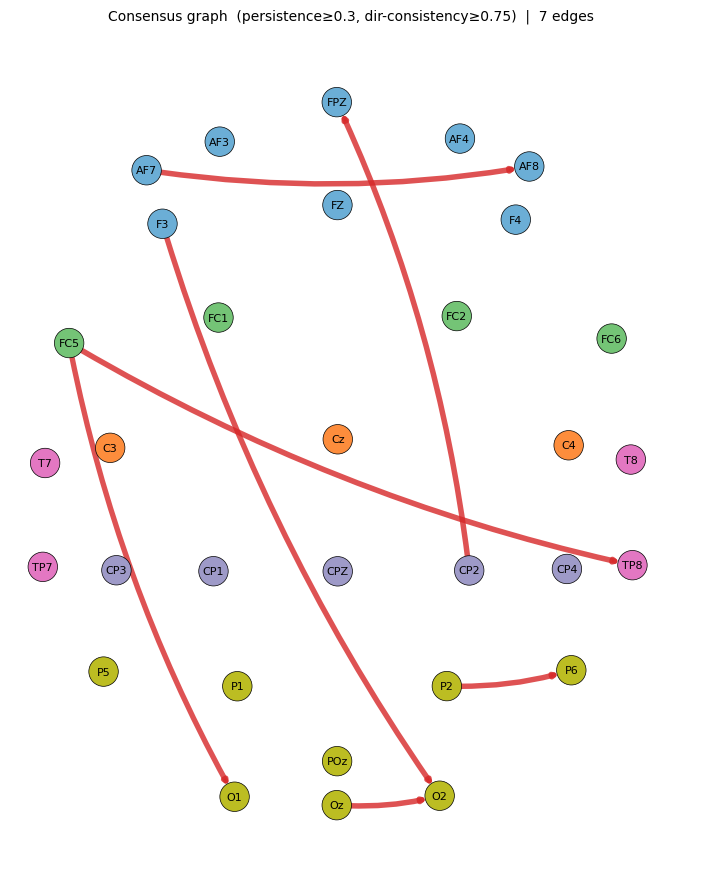

In [ ]:
PERSIST_THRESH = 0.30   # edge must exist in ≥30% of the 500 ms of windows
DIRC_THRESH = 0.75      # ...and agree on a dominant lag sign ≥75% of those windows

stats = consistency_across_windows(r_tensor, lag_tensor, r_threshold=R_THRESH)

mask = (stats['edge_persistence'] >= PERSIST_THRESH) & \
       (stats['lag_sign_consistency'] >= DIRC_THRESH)
r_consensus = np.where(mask, stats['edge_persistence'], 0.0)
lag_consensus = np.where(mask, np.round(stats['mean_lag_samples']).astype(int), 0)

G_cons = build_directed_graph(
    r_consensus, lag_consensus, ch_names,
    r_threshold=PERSIST_THRESH, sfreq=sfreq,
)

fig, ax = plt.subplots(figsize=(9, 9))
draw_lagged_graph(G_cons, ax, pos=pos,
                  title=f'Consensus graph  (persistence≥{PERSIST_THRESH}, '
                        f'dir-consistency≥{DIRC_THRESH})  |  '
                        f'{G_cons.number_of_edges()} edges')
plt.tight_layout()
plt.show()

## G. (Optional) Band-limited repeat

Re-run B–F with `FREQ_BAND = 'beta'` or `'alpha'`. Beta is the canonical sensorimotor-anticipation band; narrowing to it often sharpens directional effects that were buried in broadband noise.